In [40]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
from scipy import stats
import matplotlib.pyplot as plt

In [41]:
DATAPATH = '../data/air/AirQualityUCI.xlsx'
df = pd.read_excel(DATAPATH)
df.head()

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2004-03-10,18:00:00,2.6,1360.00,150,11.881723,1045.50,166.0,1056.25,113.0,1692.00,1267.50,13.60,48.875001,0.757754
1,2004-03-10,19:00:00,2.0,1292.25,112,9.397165,954.75,103.0,1173.75,92.0,1558.75,972.25,13.30,47.700000,0.725487
2,2004-03-10,20:00:00,2.2,1402.00,88,8.997817,939.25,131.0,1140.00,114.0,1554.50,1074.00,11.90,53.975000,0.750239
3,2004-03-10,21:00:00,2.2,1375.50,80,9.228796,948.25,172.0,1092.00,122.0,1583.75,1203.25,11.00,60.000000,0.786713
4,2004-03-10,22:00:00,1.6,1272.25,51,6.518224,835.50,131.0,1205.00,116.0,1490.00,1110.00,11.15,59.575001,0.788794


In [42]:
df.describe()

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
count,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000
mean,-34.207524,1048.869652,-159.090093,1.865576,894.475963,168.604200,794.872333,58.135898,1391.363266,974.951534,9.776600,39.483611,-6.837604
std,77.657170,329.817015,139.789093,41.380154,342.315902,257.424561,321.977031,126.931428,467.192382,456.922728,43.203438,51.215645,38.976670
min,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000
25%,0.600000,921.000000,-200.000000,4.004958,711.000000,50.000000,637.000000,53.000000,1184.750000,699.750000,10.950000,34.050000,0.692275
50%,1.500000,1052.500000,-200.000000,7.886653,894.500000,141.000000,794.250000,96.000000,1445.500000,942.000000,17.200000,48.550000,0.976823
75%,2.600000,1221.250000,-200.000000,13.636091,1104.750000,284.200000,960.250000,133.000000,1662.000000,1255.250000,24.075000,61.875000,1.296223
max,11.900000,2039.750000,1189.000000,63.741476,2214.000000,1479.000000,2682.750000,339.700000,2775.000000,2522.750000,44.600000,88.725000,2.231036


In [43]:
x = df.drop(['Date','Time'],axis = 1)

# Count of Outliers

In [44]:
def count_outliers(data,col):
        q1 = data[col].quantile(0.25,interpolation='nearest')
        q2 = data[col].quantile(0.5,interpolation='nearest')
        q3 = data[col].quantile(0.75,interpolation='nearest')
        q4 = data[col].quantile(1,interpolation='nearest')
        IQR = q3 -q1
        global LLP
        global ULP
        LLP = q1 - 1.5*IQR
        ULP = q3 + 1.5*IQR
        if data[col].min() > LLP and data[col].max() < ULP:
            print("No outliers in",i)
        else:
            print("There are outliers in",i)
            x = data[data[col]<LLP][col].size
            y = data[data[col]>ULP][col].size
            a.append(i)
            print('Count of outliers are:',x+y)
global a
a = []
for i in x.columns:
    count_outliers(df,i)

There are outliers in CO(GT)
Count of outliers are: 1898
There are outliers in PT08.S1(CO)
Count of outliers are: 484
There are outliers in NMHC(GT)
Count of outliers are: 914
There are outliers in C6H6(GT)
Count of outliers are: 606
There are outliers in PT08.S2(NMHC)
Count of outliers are: 427
There are outliers in NOx(GT)
Count of outliers are: 509
There are outliers in PT08.S3(NOx)
Count of outliers are: 601
There are outliers in NO2(GT)
Count of outliers are: 1696
There are outliers in PT08.S4(NO2)
Count of outliers are: 450
There are outliers in PT08.S5(O3)
Count of outliers are: 457
There are outliers in T
Count of outliers are: 368
There are outliers in RH
Count of outliers are: 366
There are outliers in AH
Count of outliers are: 367


In [45]:
#Replacing outliers with null values
for i in x.columns:
    Q1 = np.percentile(df[i], 25,interpolation = 'midpoint')
    Q3 = np.percentile(df[i], 75,interpolation = 'midpoint')
    IQR = Q3 - Q1
    upper1 = np.where(df[i] >= (Q3+1.5*IQR))
    lower1 = np.where(df[i] <= (Q1-1.5*IQR))
    for j in range(len(upper1[0])):
        df.replace(df[i][upper1[0][j]],np.nan, inplace = True)
    for k in range(len(lower1[0])):
        df.replace(df[i][lower1[0][k]],np.nan, inplace = True)

In [46]:
#replacing outliers with mean of outliers of that column
for t in x.columns:
    q1=df[t].quantile(0.25)
    q2=df[t].quantile(0.5)
    q3=df[t].quantile(0.75)
    IQR=q3-q1
    LLP=q1-1.5*IQR
    ULP=q3+1.5*IQR
    l=[]
    m=[]
    df3 = df[df[t].values>ULP][t]
    for i in df3:
        l.append(i)
    df4 = df[df[t].values<LLP][t]
    for i in df4:
        m.append(i)
    k = 0
    p = 0
    if len(l)>0:
        k=sum(l)/len(l)
    if len(m)>0:
        p=sum(m)/len(m)
    u=(k+p)/2
    for i in df.columns:
        if df[i].isnull().sum()>=1:
            df[i].fillna(u,inplace = True)

In [47]:
df.isnull().sum()

Date             0
Time             0
CO(GT)           0
PT08.S1(CO)      0
NMHC(GT)         0
C6H6(GT)         0
PT08.S2(NMHC)    0
NOx(GT)          0
PT08.S3(NOx)     0
NO2(GT)          0
PT08.S4(NO2)     0
PT08.S5(O3)      0
T                0
RH               0
AH               0
dtype: int64

In [48]:
df.describe()

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
count,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000
mean,2.149131,1056.798519,23.814413,9.794443,902.404830,204.109416,802.801200,93.705891,1399.292133,982.880401,17.684988,47.412478,1.091263
std,1.108494,300.861149,90.532544,7.441217,318.381752,214.538374,299.057902,60.755027,441.106718,437.822848,9.197998,19.222286,0.512680
min,0.100000,2.706034,2.706034,0.149048,2.706034,2.000000,2.706034,2.000000,2.706034,2.706034,-1.900000,2.706034,0.184679
25%,1.200000,921.000000,2.706034,4.004958,711.000000,50.000000,637.000000,53.000000,1184.750000,699.750000,10.925000,34.050000,0.746115
50%,2.200000,1052.500000,2.706034,7.886653,894.500000,141.000000,794.250000,96.000000,1445.500000,942.000000,17.200000,48.550000,1.015441
75%,2.706034,1221.250000,2.706034,13.636091,1104.750000,284.200000,960.250000,133.000000,1662.000000,1255.250000,24.075000,61.875000,1.364988
max,5.500000,2039.750000,1189.000000,63.741476,2214.000000,1479.000000,2682.750000,339.700000,2775.000000,2522.750000,44.600000,88.725000,2.706034


In [49]:
#Encoding the date time column
def LABEL_ENCODING(c1):
    from sklearn import preprocessing
    # label_encoder object knows how to understand word labels.
    label_encoder = preprocessing.LabelEncoder()
 
    # Encode labels in column 'species'.
    df[c1]= label_encoder.fit_transform(df[c1])
 
    df[c1].unique()
    return df

In [50]:
LABEL_ENCODING('Date')
LABEL_ENCODING('Time')

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,0,18,2.6,1360.00,150.000000,11.881723,1045.50,166.0,1056.25,113.0,1692.00,1267.50,13.600,48.875001,0.757754
1,0,19,2.0,1292.25,112.000000,9.397165,954.75,103.0,1173.75,92.0,1558.75,972.25,13.300,47.700000,0.725487
2,0,20,2.2,1402.00,88.000000,8.997817,939.25,131.0,1140.00,114.0,1554.50,1074.00,11.900,53.975000,0.750239
3,0,21,2.2,1375.50,80.000000,9.228796,948.25,172.0,1092.00,122.0,1583.75,1203.25,11.000,60.000000,0.786713
4,0,22,1.6,1272.25,51.000000,6.518224,835.50,131.0,1205.00,116.0,1490.00,1110.00,11.150,59.575001,0.788794
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9352,390,10,3.1,1314.25,2.706034,13.529605,1101.25,471.7,538.50,189.8,1374.25,1728.50,21.850,29.250000,0.756824
9353,390,11,2.4,1162.50,2.706034,11.355157,1027.00,353.3,603.75,179.2,1263.50,1269.00,24.325,23.725000,0.711864
9354,390,12,2.4,1142.00,2.706034,12.374538,1062.50,293.0,603.25,174.7,1240.75,1092.00,26.900,18.350000,0.640649
9355,390,13,2.1,1002.50,2.706034,9.547187,960.50,234.5,701.50,155.7,1041.00,769.75,28.325,13.550000,0.513866


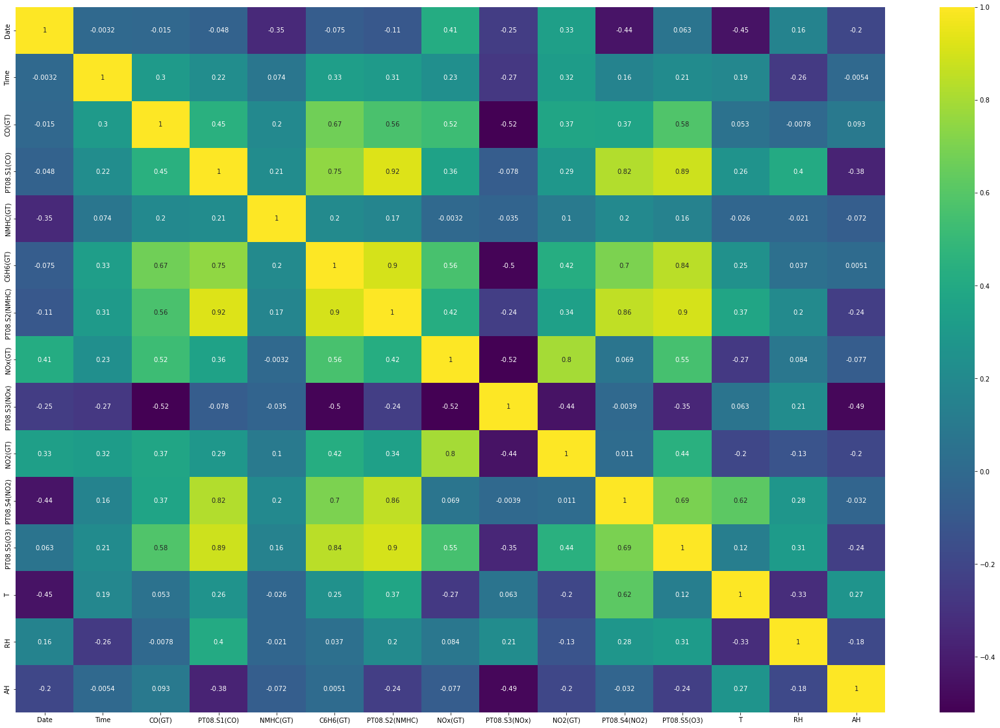

In [51]:
#plotting histogram for correlation values
import seaborn as sns
corrmat=df.corr()
top_corr_feature=corrmat.index
plt.figure(figsize=(30,20))

g=sns.heatmap(df[top_corr_feature].corr(),annot=True,cmap='viridis')

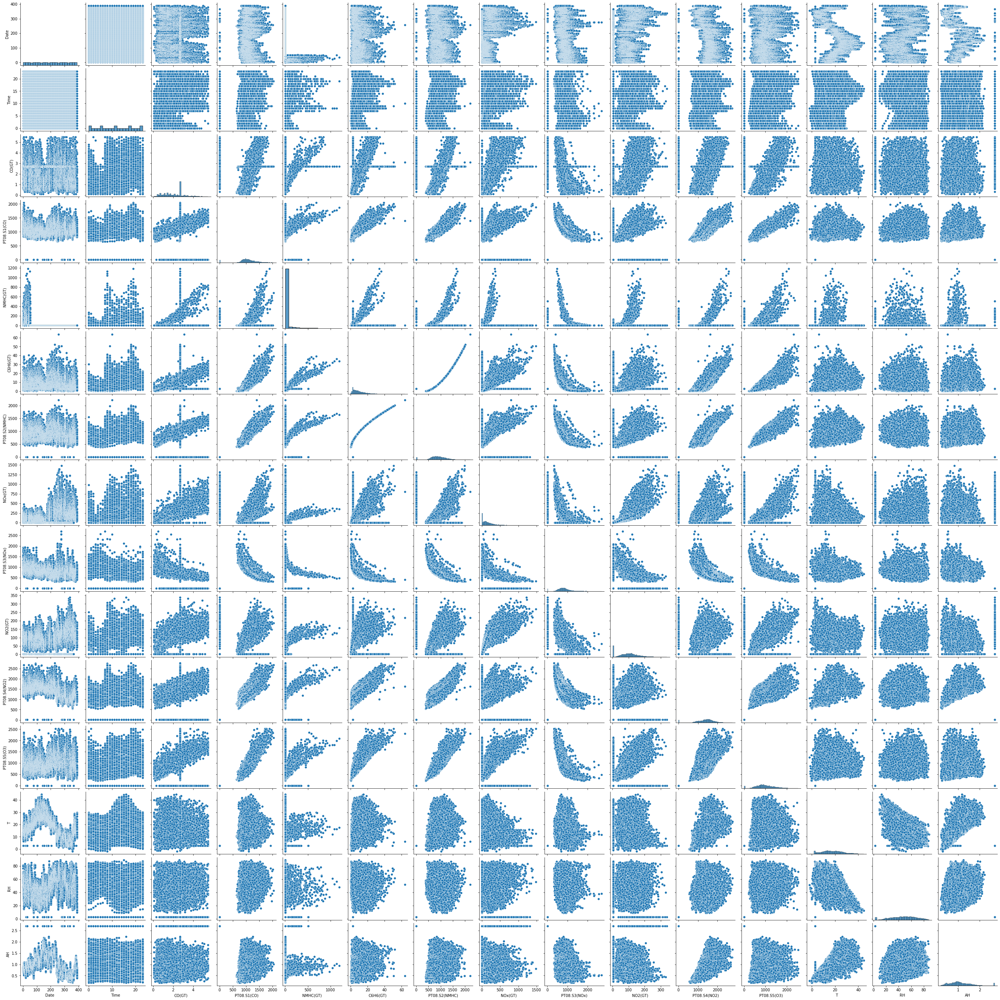

In [52]:
sns.pairplot(df)

In [53]:
def count_outliers(data,col):
        q1 = data[col].quantile(0.25,interpolation='nearest')
        q2 = data[col].quantile(0.5,interpolation='nearest')
        q3 = data[col].quantile(0.75,interpolation='nearest')
        q4 = data[col].quantile(1,interpolation='nearest')
        IQR = q3 -q1
        global LLP
        global ULP
        LLP = q1 - 1.5*IQR
        ULP = q3 + 1.5*IQR
        if data[col].min() > LLP and data[col].max() < ULP:
            print("No outliers in",i)
        else:
            print("There are outliers in",i)
            x = data[data[col]<LLP][col].size
            y = data[data[col]>ULP][col].size
            l=  data[data[col]<LLP][col].mean()
            m=  data[data[col]<LLP][col].mean()
            a.append(i)
            
# global a
a = []
for i in x.columns:
    count_outliers(df,i)

There are outliers in CO(GT)
There are outliers in PT08.S1(CO)
There are outliers in NMHC(GT)
There are outliers in C6H6(GT)
There are outliers in PT08.S2(NMHC)
There are outliers in NOx(GT)
There are outliers in PT08.S3(NOx)
There are outliers in NO2(GT)
There are outliers in PT08.S4(NO2)
There are outliers in PT08.S5(O3)
There are outliers in T
No outliers in RH
There are outliers in AH


In [54]:
#dropping the target variable and selecting features
feature=df
feature=feature.drop(['Date','Time','CO(GT)','NMHC(GT)','NOx(GT)','NO2(GT)','C6H6(GT)'],axis=1)
# feature=feature.drop('Date',axis=1)
label=df
label=label.drop(['Date','Time','PT08.S1(CO)','PT08.S2(NMHC)','PT08.S3(NOx)','PT08.S4(NO2)','PT08.S5(O3)','T','RH','AH'],axis=1)
# feature.to_excel("test.xlsx")
print(label)

      CO(GT)    NMHC(GT)   C6H6(GT)  NOx(GT)  NO2(GT)
0        2.6  150.000000  11.881723    166.0    113.0
1        2.0  112.000000   9.397165    103.0     92.0
2        2.2   88.000000   8.997817    131.0    114.0
3        2.2   80.000000   9.228796    172.0    122.0
4        1.6   51.000000   6.518224    131.0    116.0
...      ...         ...        ...      ...      ...
9352     3.1    2.706034  13.529605    471.7    189.8
9353     2.4    2.706034  11.355157    353.3    179.2
9354     2.4    2.706034  12.374538    293.0    174.7
9355     2.1    2.706034   9.547187    234.5    155.7
9356     2.2    2.706034  11.932060    265.2    167.7

[9357 rows x 5 columns]


In [55]:
import sklearn
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(feature)
df_normal=scaler.transform(feature)
# feature['PT08.S1(CO)','PT08.S2(NMHC)','PT08.S3(NOx)','PT08.S4(NO2)','PT08.S5(O3)','T','RH','AH']=df_normal
feature.iloc[:,:]=df_normal
print(feature)
label
# yf.shape

      PT08.S1(CO)  PT08.S2(NMHC)  PT08.S3(NOx)  PT08.S4(NO2)  PT08.S5(O3)  \
0        1.007833       0.449469      0.847536      0.663612     0.650114   
1        0.782634       0.164419      1.240458      0.361514    -0.024281   
2        1.147439       0.115733      1.127597      0.351879     0.208131   
3        1.059354       0.144002      0.967084      0.418193     0.503357   
4        0.716154      -0.210152      1.344958      0.205648     0.290360   
...           ...            ...           ...           ...          ...   
9352     0.855761       0.624583     -0.883827     -0.056774     1.703108   
9353     0.351349       0.391360     -0.665630     -0.307861     0.653540   
9354     0.283207       0.502867     -0.667302     -0.359438     0.249246   
9355    -0.180487       0.182480     -0.338753     -0.812301    -0.486822   
9356     0.046374       0.454966     -0.497593     -0.613925    -0.381180   

             T        RH        AH  
0    -0.444141  0.076089 -0.650556  
1

,CO(GT),NMHC(GT),C6H6(GT),NOx(GT),NO2(GT)
0,2.6,150.000000,11.881723,166.0,113.0
1,2.0,112.000000,9.397165,103.0,92.0
2,2.2,88.000000,8.997817,131.0,114.0
3,2.2,80.000000,9.228796,172.0,122.0
4,1.6,51.000000,6.518224,131.0,116.0
...,...,...,...,...,...
9352,3.1,2.706034,13.529605,471.7,189.8
9353,2.4,2.706034,11.355157,353.3,179.2
9354,2.4,2.706034,12.374538,293.0,174.7
9355,2.1,2.706034,9.547187,234.5,155.7


In [60]:
feature.shape[1]

8

# Generate AIR QUALITY dataset

In [74]:
import torch
from torch.utils.data import Dataset,DataLoader
ROOTPATH="../data/"
path=ROOTPATH
class AirDataSet(Dataset):
    def __init__(self,feature,label,root_dir=path,window=10,horizon=1):
        self.window=window# for RFF, windows means number of features
        self.horizon=horizon# length predicted
        self.num,self.dim=feature.shape
        self.root_dir=root_dir
        self.num_samples=max(self.num - self.window - self.horizon + 1, 0)
        self.feature,self.label=self.__get_samples(feature,label)
    def __get_samples(self,feature,label):# generate time series
        X=torch.zeros(self.num_samples,self.window,feature.shape[1])
        Y=torch.zeros(self.num_samples,1,label.shape[1])
        for i in range(self.num_samples):
            start =i
            end=i+self.window
            xi=np.array(feature.iloc[start:end, :])
            yi=np.array(label.iloc[end+self.horizon-1, :])
            X[i, :, :] = torch.from_numpy(xi)
            Y[i, :, :] = torch.from_numpy(yi)
        return (X,Y)


    def __len__(self):
        return self.num_samples

    def __getitem__(self, index):
        return [self.feature[index, :, :], self.label[index, :, :]]

length=feature.shape[0]
print(length)
train_len=int(0.8*length)
print(train_len)
test_len=int(0.2*length)
print(test_len)
train_set=AirDataSet(feature.iloc[1:train_len,:],label.iloc[1:train_len,:],ROOTPATH)
test_set=AirDataSet(feature.iloc[train_len:length,:],label.iloc[train_len:length,:],ROOTPATH)


9357
7485
1871


# dataloader

In [76]:
batch=5
train_loader = DataLoader(dataset=train_set,batch_size=batch,shuffle=False) 
test_loader = DataLoader(dataset=test_set,batch_size=100,shuffle=False) 

for (idx,data) in enumerate(train_loader):
    
    print(data)

[tensor([[[ 0.7826,  0.1644,  1.2405,  0.3615, -0.0243, -0.4768,  0.0150,
          -0.7135],
         [ 1.1474,  0.1157,  1.1276,  0.3519,  0.2081, -0.6290,  0.3414,
          -0.6652],
         [ 1.0594,  0.1440,  0.9671,  0.4182,  0.5034, -0.7268,  0.6549,
          -0.5941],
         [ 0.7162, -0.2102,  1.3450,  0.2056,  0.2904, -0.7105,  0.6328,
          -0.5900],
         [ 0.4660, -0.4779,  1.7847, -0.0143, -0.0768, -0.7078,  0.6120,
          -0.5979],
         [ 0.4261, -0.6687,  2.2035, -0.1509, -0.5719, -0.6915,  0.4871,
          -0.6456],
         [ 0.2641, -0.7237,  2.1751, -0.1509, -0.5788, -0.7622,  0.6549,
          -0.6262],
         [ 0.1237, -0.9232,  2.5956, -0.2795, -0.8300, -0.7649,  0.6380,
          -0.6368],
         [-0.1564, -1.0732,  3.0170, -0.3730, -1.1001, -0.8084,  0.6653,
          -0.6624],
         [-0.1522, -1.1800,  3.3932, -0.4592, -1.2280, -0.8274,  0.6796,
          -0.6725]],

        [[ 1.1474,  0.1157,  1.1276,  0.3519,  0.2081, -0.6290,  0.